This notebook shows how to retrive data from PDF files and analyze it. 

# data collection and processing

In [1]:
# data manipulation
import pandas as pd
import numpy as np 
import os 

# text manipulation
import pdfplumber

In [2]:
import os

All data comes from [tesiunam](https://tesiunam.dgb.unam.mx/) webserver using keywords to access:
1. search for Yasmin Esquivel Mossa
2. click on the name of her thesis advisor (Martha Rodriguez)
3. copy all records and save ir in a csv with name "records.xlsx"
4. download all thesis in pdf format and name them following the next format: 

> record - institution - unam_id

Notes: while i was downloading the PDFs, i noted the next weird things 
* record 32 have a weird cover  
* record 36 called "Obligatoriedad del reglamento interior de trabajo" is not a law thesis, is from natural sciences (QFB) and was an error by unam curators
* There are various records that ate "tesis colecuvas" like record 44, 58, etc 
* record 82 is about corruption of public works
* record 85 is not a law thesis, is from engineering
* suspicious titles (because they are repetitive)
    * Desaparicion del apartado B del articulo 123 constitucional = La supresion del apartado B del articulo 123
    * estudio/analisis dogmatico, SIDA, efectos psicologicos, huelga, solidaridad, prima de antiguedad, trabajo domestico, hostigameinto sexual

There are at least 4 cases with plagiarism according to:
> https://elpais.com/mexico/2022-12-25/el-modus-operandi-de-copia-de-tesis-de-la-profesora-que-asesoro-a-la-ministra-yasmin-esquivel.html 

The set of pdf files have a protection assigned by unam curators and can not be used for text mining. To solve this, remove the protection using qpdf.


```bash
# tho folder with pdfs
cd locked

# removes protection
for file in *pdf; do
    qpdf --decrypt --password="" "$file" "${file%.*}_unlocked.pdf"
done

# move unlocked files to a folder
mv *_unlocked* ../unlocked
```


In [3]:
# empty list to collect data per file
files = []

# do the next things per each file in the folder
for file in os.listdir("unlocked"):
    
    # open file
    with pdfplumber.open(os.path.join("unlocked", file)) as pdf:

        # get the num pages
        num_pages = len(pdf.pages)

        # concat the text of all pages
        text = "\n".join([page.extract_text() for page in pdf.pages])

        # replace \n by blanck spaces
        # text = text.replace('\n', ' ')

        # get the metadata
        metadata = pdf.metadata

        # add the info to the empty list
        files.append({"file": file, "num_pages": num_pages, "text": text, "metadata": metadata})

# build a df
df = pd.DataFrame(files)
df.head(2)

,file,num_pages,text,metadata
0,1 - fesa - 0797378_unlocked.pdf,135,\n UNIVERSIDAD NACIONAL AUTÓNOMA \n ...,{}
1,10 - fesa - 0680027_A1_unlocked.pdf,144,UNIVERSIDAD NACIONAL AUTÓNOMA \n ...,"{'Author': 'Tesis', 'CreationDate': 'D:2011112..."


In [4]:
# split the "file" col
cols = ["record", "institution", "unam_id"]
df[cols] = df['file'].str.split('-', expand=True)
df.head(2)

,file,num_pages,text,metadata,record,institution,unam_id
0,1 - fesa - 0797378_unlocked.pdf,135,\n UNIVERSIDAD NACIONAL AUTÓNOMA \n ...,{},1,fesa,0797378_unlocked.pdf
1,10 - fesa - 0680027_A1_unlocked.pdf,144,UNIVERSIDAD NACIONAL AUTÓNOMA \n ...,"{'Author': 'Tesis', 'CreationDate': 'D:2011112...",10,fesa,0680027_A1_unlocked.pdf


In [5]:
# read the unam records
records = pd.read_excel("records.xlsx")

# open a col with detected plagiarism cases 
names =  [
    "Esquivel Mossa", "Baez Gutierrez", 
    "Loranca Olguin", "Galguera Gonzalez",
    "Caballero Villalobos", "Lara Morantes",
    "García Carvajal", "Reyes Kimball"
]

# create filters
filters = [
    records.author.str.contains("|".join(names)),
    ~records.author.str.contains("|".join(names))
]

values = ["Yes", "No"]

# merge annotations
records["plagiarism"] = np.select(filters, values)
records.head(2)

,record,degree,author,title,year,available_pdf,plagiarism
0,10,lic,"Ibarra López, María Yuritzi",Las cotizaciones al seguro social como obstácu...,2011,Texto completo,No
1,20,lic,"Sámano Sámano, Alberto",Análisis de la prima de antigüedad en el Derec...,2010,Texto completo,No


In [12]:
# set the same data type 
df['record'] = df['record'].astype(int)
records['record'] = records['record'].astype(int)

# merge data 
df_merged = pd.merge(records, df, on='record')
df_merged.head(2)

,record,degree,author,title,year,available_pdf,plagiarism,file,num_pages,text,metadata,institution,unam_id
0,10,lic,"Ibarra López, María Yuritzi",Las cotizaciones al seguro social como obstácu...,2011,Texto completo,No,10 - fesa - 0680027_A1_unlocked.pdf,144,UNIVERSIDAD NACIONAL AUTÓNOMA \n ...,"{'Author': 'Tesis', 'CreationDate': 'D:2011112...",fesa,0680027_A1_unlocked.pdf
1,20,lic,"Sámano Sámano, Alberto",Análisis de la prima de antigüedad en el Derec...,2010,Texto completo,No,20 - fd - 0663269_A1_unlocked.pdf,127,UNIVERSIDAD NACIONAL AUTONOMA DE MÉXICO\nFACUL...,"{'Author': '', 'CreationDate': 'D:201009200815...",fd,0663269_A1_unlocked.pdf


In [13]:
# change institution names
filters = [
    df_merged.institution.str.contains("fesa"),
    df_merged.institution.str.contains("fd"),
    df_merged.institution.str.contains("fesc"),
    df_merged.institution.str.contains("fesaca"),
    df_merged.institution.str.contains("unk"),
]
values = ["FES Aragón", "Facultad de derecho", "Cuautitlán", "Acatlán", "Desconocido"]

# merge annots
df_merged["institution"] = np.select(filters, values)
df_merged.head()

,record,degree,author,title,year,available_pdf,plagiarism,file,num_pages,text,metadata,institution,unam_id
0,10,lic,"Ibarra López, María Yuritzi",Las cotizaciones al seguro social como obstácu...,2011,Texto completo,No,10 - fesa - 0680027_A1_unlocked.pdf,144,UNIVERSIDAD NACIONAL AUTÓNOMA \n ...,"{'Author': 'Tesis', 'CreationDate': 'D:2011112...",FES Aragón,0680027_A1_unlocked.pdf
1,20,lic,"Sámano Sámano, Alberto",Análisis de la prima de antigüedad en el Derec...,2010,Texto completo,No,20 - fd - 0663269_A1_unlocked.pdf,127,UNIVERSIDAD NACIONAL AUTONOMA DE MÉXICO\nFACUL...,"{'Author': '', 'CreationDate': 'D:201009200815...",Facultad de derecho,0663269_A1_unlocked.pdf
2,30,lic,"Ramírez Solis, Dolores",Los médicos residentes en período de adiestram...,2009,Texto completo,No,30 - fd - 0643756_A1_unlocked.pdf,149,UNIVERSIDAD NACIONAL \nAUTÓNOMA DE MÉXICO \n \...,"{'Author': '.', 'CreationDate': 'D:20090521144...",Facultad de derecho,0643756_A1_unlocked.pdf
3,100,lic,"Celis García, Claudia",Analisis juridico de las disposiciones testame...,2004,Texto completo,No,100 - fd - 0337393_A1_unlocked.pdf,208,UNIVERSIDAD NACIONAL AUTONOMA \nDE MEXlCO \...,"{'CreationDate': 'D:20100602115130-05'00'', 'C...",Facultad de derecho,0337393_A1_unlocked.pdf
4,110,lic,"Porras Piña, Aurora",Analisis de la funcion de los procuradores aux...,2004,Texto completo,No,110 - fd - 0334592_unlocked.pdf,138,UNIVERSIDAD NACIONAL AUTONOMA \nDE MEXICO \...,"{'Author': 'AURORA PORRAS PlÑA', 'CreationDate...",Facultad de derecho,0334592_unlocked.pdf


In [14]:
# set col order 
ordered_cols = [
    'record', 'author', 'title', 'institution', 'year', 'degree', 'plagiarism',
    'num_pages', 'text', 'metadata', 'unam_id', 'available_pdf', 'file'
]

df_merged = df_merged[ordered_cols]
df_merged.head(2)

,record,author,title,institution,year,degree,plagiarism,num_pages,text,metadata,unam_id,available_pdf,file
0,10,"Ibarra López, María Yuritzi",Las cotizaciones al seguro social como obstácu...,FES Aragón,2011,lic,No,144,UNIVERSIDAD NACIONAL AUTÓNOMA \n ...,"{'Author': 'Tesis', 'CreationDate': 'D:2011112...",0680027_A1_unlocked.pdf,Texto completo,10 - fesa - 0680027_A1_unlocked.pdf
1,20,"Sámano Sámano, Alberto",Análisis de la prima de antigüedad en el Derec...,Facultad de derecho,2010,lic,No,127,UNIVERSIDAD NACIONAL AUTONOMA DE MÉXICO\nFACUL...,"{'Author': '', 'CreationDate': 'D:201009200815...",0663269_A1_unlocked.pdf,Texto completo,20 - fd - 0663269_A1_unlocked.pdf


In [15]:
# save data 
df_merged.to_pickle("data.pkl")

# data analysis

In [64]:
# data manipulation
import pandas as pd
import numpy as np 
import re
import collections

from nltk.corpus import stopwords

In [74]:
# data viz
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [3]:
# text manipulation
import string  
from collections import defaultdict
import texthero as hero
from wordcloud import WordCloud

In [41]:
df = pd.read_pickle("data.pkl")
df.head(1)

,record,author,title,institution,year,degree,plagiarism,num_pages,text,metadata,unam_id,available_pdf,file
0,10,"Ibarra López, María Yuritzi",Las cotizaciones al seguro social como obstácu...,FES Aragón,2011,lic,No,144,UNIVERSIDAD NACIONAL AUTÓNOMA \n ...,"{'Author': 'Tesis', 'CreationDate': 'D:2011112...",0680027_A1_unlocked.pdf,Texto completo,10 - fesa - 0680027_A1_unlocked.pdf


In [44]:
def clean_text(text):
    # Convertimos el texto a minúsculas
    text = text.lower()
        
    # Eliminamos stopwords
    stop_words = set(stopwords.words('spanish'))
    words = text.split()
    words = [word for word in words if word not in stop_words]
    text = ' '.join(words)
    
    # Eliminamos símbolos que no sean letras o números
    text = re.sub(r'[^a-zA-Z0-9\sáéíóúÁÉÍÓÚñÑ]', '', text)
    
    return text

In [45]:
def top_300_words(row):
    # Separar el texto de la fila en una lista de palabras
    words = row['clean_text'].split()
    # Contar la frecuencia de cada palabra
    word_counts = collections.Counter(words)
    # Ordenar las palabras de acuerdo a su frecuencia, de mayor a menor
    sorted_words = sorted(word_counts, key=word_counts.get, reverse=True)
    # Unir las 300 primeras palabras en una sola cadena, separadas por espacios en blanco
    top_300 = ' '.join(sorted_words[:300])
    return top_300

# Aplicar la función a cada fila del DataFrame y guardar el resultado en una nueva columna
df['top300'] = df.apply(top_300_words, axis=1)

,record,author,title,institution,year,degree,plagiarism,num_pages,text,metadata,unam_id,available_pdf,file,clean_text
0,10,"Ibarra López, María Yuritzi",Las cotizaciones al seguro social como obstácu...,FES Aragón,2011,lic,No,144,UNIVERSIDAD NACIONAL AUTÓNOMA \n ...,"{'Author': 'Tesis', 'CreationDate': 'D:2011112...",0680027_A1_unlocked.pdf,Texto completo,10 - fesa - 0680027_A1_unlocked.pdf,universidad nacional autónoma méxico facultad ...
1,20,"Sámano Sámano, Alberto",Análisis de la prima de antigüedad en el Derec...,Facultad de derecho,2010,lic,No,127,UNIVERSIDAD NACIONAL AUTONOMA DE MÉXICO\nFACUL...,"{'Author': '', 'CreationDate': 'D:201009200815...",0663269_A1_unlocked.pdf,Texto completo,20 - fd - 0663269_A1_unlocked.pdf,universidad nacional autonoma méxico facultad ...
2,30,"Ramírez Solis, Dolores",Los médicos residentes en período de adiestram...,Facultad de derecho,2009,lic,No,149,UNIVERSIDAD NACIONAL \nAUTÓNOMA DE MÉXICO \n \...,"{'Author': '.', 'CreationDate': 'D:20090521144...",0643756_A1_unlocked.pdf,Texto completo,30 - fd - 0643756_A1_unlocked.pdf,universidad nacional autónoma méxico seminario...
3,100,"Celis García, Claudia",Analisis juridico de las disposiciones testame...,Facultad de derecho,2004,lic,No,208,UNIVERSIDAD NACIONAL AUTONOMA \nDE MEXlCO \...,"{'CreationDate': 'D:20100602115130-05'00'', 'C...",0337393_A1_unlocked.pdf,Texto completo,100 - fd - 0337393_A1_unlocked.pdf,universidad nacional autonoma mexlco facultad ...
4,110,"Porras Piña, Aurora",Analisis de la funcion de los procuradores aux...,Facultad de derecho,2004,lic,No,138,UNIVERSIDAD NACIONAL AUTONOMA \nDE MEXICO \...,"{'Author': 'AURORA PORRAS PlÑA', 'CreationDate...",0334592_unlocked.pdf,Texto completo,110 - fd - 0334592_unlocked.pdf,universidad nacional autonoma mexico facultad ...


In [80]:
def plot_words(text):

    # Separar el texto de la primera fila de la columna 'top300' en una lista de palabras
    words = text.split()
    
    # Contar la frecuencia de cada palabra
    word_counts = collections.Counter(words)
    
    # Ordenar las palabras de acuerdo a su frecuencia, de mayor a menor
    sorted_words = sorted(word_counts, key=word_counts.get, reverse=True)
    
    # Tomar las 20 palabras más frecuentes y sus frecuencias
    top_20_words = sorted_words[:20]
    top_20_counts = [word_counts[w] for w in top_20_words]
    
    # Crear el DataFrame
    df_words = pd.DataFrame({'word': top_20_words, 'count': top_20_counts})
    
    # Crear el gráfico de barras
    sns.barplot(y='word', x='count', data=df_words, palette="tab20")

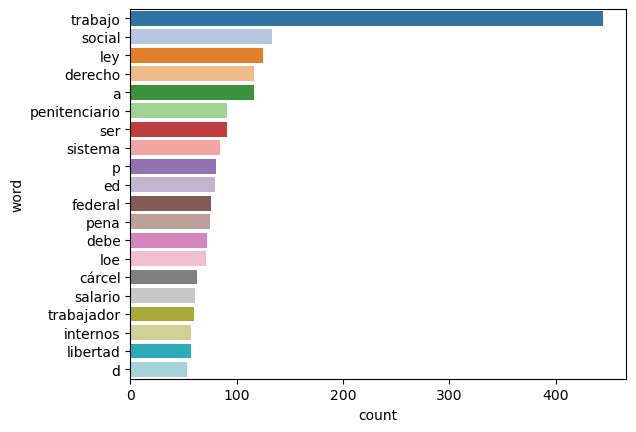

In [90]:
plot_words(df["clean_text"][409])

In [ ]:
from transformers import BertModel, BertTokenizer
import torch

In [17]:


# data manipulation
import pandas as pd
import numpy as np 


import nltk

# ml 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA

ModuleNotFoundError: No module named 'transformers'

In [2]:
df = pd.read_pickle("data.pkl")

In [27]:
# take the top500 most frecuent words 
def limpiar_texto(texto):
    # Tokenizar el texto
    tokens = texto.split()
    
    # Eliminar signos de puntuación
    tokens = [t.strip(string.punctuation) for t in tokens]
    
    # Eliminar palabras que no aportan información (stopwords)
    stopwords = ["a", "ante", "bajo", "cabe", "con", "contra", "de", "desde", "en", "entre", "hacia", "hasta", "para", "por", "según", "sin", "so", "sobre", "tras"]
    tokens = [t for t in tokens if t not in stopwords]
    
    # Contar cuántas veces aparece cada palabra y ordenarlas por frecuencia
    freq = {}
    for t in tokens:
        if t in freq:
            freq[t] += 1
        else:
            freq[t] = 1
    freq = sorted(freq.items(), key=lambda x: x[1], reverse=True)
    
    # Conservar las 500 palabras más frecuentes y eliminar las demás
    freq = freq[:500]
    tokens = [t for t, f in freq]
    
    # Unir las palabras conservadas en una sola cadena de texto
    clean_text = " ".join(tokens)
    
    return clean_text

# apply to text col
df["clean_text"] = df["text"].apply(limpiar_texto)

In [28]:
vectorizer = CountVectorizer()
x = vectorizer.fit_transform(df["clean_text"])

pca = PCA(n_components=2)
x_pca = pca.fit_transform(X.toarray())

df_numpy = pd.DataFrame(x_pca, columns=["pc1", "pc2"])
df = pd.concat([df, df_numpy], axis=1)

df.head()

,record,degree,author,title,year,pdf,plagio,file,num_pages,text,metadata,institution,unam_id,clean_text,pc1,pc2
0,1,lic,"Espinosa Roldán, Hazel,",Las juntas de conciliación y arbitraje y su de...,2019,Texto completo,No,1 - fesa - 0797378_unlocked.pdf,135,UNIVERSIDAD NACIONAL AUTÓNOMA ...,{},Aragón,0797378_unlocked.pdf,que la y el se las los del un es Juntas su una...,-2.679043,-2.742339
1,2,lic,"Alva Rubio, Edson Miguel,",La prima de antigüedad y los trabajadores de c...,2017,Texto completo.,No,2 - fesa - 0759835_unlocked.pdf,129,UNIVERSIDAD NACIONAL AUTÓNOMA DE MÉXICO FA...,"{'Author': 'EDSON MIGUEL ALVA RUBIO', 'Creatio...",Aragón,0759835_unlocked.pdf,la que el y los del se DE es las su o trabajo ...,-4.713238,-0.902879
2,3,lic,"Mendoza Blanco, Diana María,",Reflexiones sobre el régimen jurídicolaboral d...,2015,Texto completo.,No,3 - fd - 0728576_unlocked.pdf,177,UNIVERSIDAD NACIONAL AUTÓNOMA DE MÉxICO FACU...,"{'Author': 'DIANA MARÍA MENDOZA BLANCO', 'Crea...",Facultad de derecho,0728576_unlocked.pdf,la que el y los del las se al o es su un no un...,-3.136490,-3.888464
3,4,lic,"Cervantes Guerrero, María de Lourdes,",La cédula profesional vigente o carta de pasan...,2013,Texto completo.,No,4 - fesa - 0704097_unlocked.pdf,132,UNIVERSIDAD NACIONAL AUTÓNOMA ...,{'Author': 'MARÍA DE LOURDES CERVANTES GUERRER...,Aragón,0704097_unlocked.pdf,la que el y del se los las es o un al no una D...,-2.279732,-2.663254
4,5,lic,"Sánchez Fuentes, Salvador,",El intermediario en el derecho laboral mexicano,2013,Texto completo.,No,5 - fd - 0687594_unlocked.pdf,234,UNIVERSIDAD NACIONAL AUTONOMA DE MEXI...,"{'Author': 'Usuario Final', 'CreationDate': 'D...",Facultad de derecho,0687594_unlocked.pdf,la que y el los del las se trabajo o un una no...,-4.009317,-1.795037


In [29]:
fig = px.scatter(
    df,
    x = "pc1", y = "pc2",
    color = "plagio",
    width=800, height=700,
    hover_name="title",
    hover_data=["author", "year", "record"])

fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
fig.update_layout(template="plotly_white")
#fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
#fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
fig.show()

In [42]:
df["clean_text_pca"] = df["clean_text"].pipe(hero.clean)

df["pca"] = df["clean_text_pca"].pipe(hero.tfidf).pipe(hero.pca)

# Usa la función apply para aplicar una función a cada fila del DataFrame
def extract_values(row):
    # Obtén los valores de la lista en la columna 'values'
    val1, val2 = row['pca']
    # Crea dos nuevas columnas en el DataFrame con los valores extraídos
    row['PCA1_text500'] = val1
    row['PCA2_text500'] = val2
    # Devuelve la fila modificada
    return row

df = df.apply(extract_values, axis=1)
df.head()

,record,degree,author,title,year,pdf,plagio,file,num_pages,text,metadata,institution,unam_id,clean_text,pc1,pc2,clean_text_pca,pca,PCA1_text500,PCA2_text500
0,1,lic,"Espinosa Roldán, Hazel,",Las juntas de conciliación y arbitraje y su de...,2019,Texto completo,No,1 - fesa - 0797378_unlocked.pdf,135,UNIVERSIDAD NACIONAL AUTÓNOMA ...,{},Aragón,0797378_unlocked.pdf,que la y el se las los del un es Juntas su una...,-2.679043,-2.742339,que la el se las los del un es juntas su una l...,"[-0.10340913156134009, -0.12355285900304487]",-0.103409,-0.123553
1,2,lic,"Alva Rubio, Edson Miguel,",La prima de antigüedad y los trabajadores de c...,2017,Texto completo.,No,2 - fesa - 0759835_unlocked.pdf,129,UNIVERSIDAD NACIONAL AUTÓNOMA DE MÉXICO FA...,"{'Author': 'EDSON MIGUEL ALVA RUBIO', 'Creatio...",Aragón,0759835_unlocked.pdf,la que el y los del se DE es las su o trabajo ...,-4.713238,-0.902879,la que el los del se de es las su trabajo trab...,"[-0.09097012191961076, -0.16231040274865022]",-0.090970,-0.162310
2,3,lic,"Mendoza Blanco, Diana María,",Reflexiones sobre el régimen jurídicolaboral d...,2015,Texto completo.,No,3 - fd - 0728576_unlocked.pdf,177,UNIVERSIDAD NACIONAL AUTÓNOMA DE MÉxICO FACU...,"{'Author': 'DIANA MARÍA MENDOZA BLANCO', 'Crea...",Facultad de derecho,0728576_unlocked.pdf,la que el y los del las se al o es su un no un...,-3.136490,-3.888464,la que el los del las se al es su un una como ...,"[-0.06398980382734662, -0.14120461656568814]",-0.063990,-0.141205
3,4,lic,"Cervantes Guerrero, María de Lourdes,",La cédula profesional vigente o carta de pasan...,2013,Texto completo.,No,4 - fesa - 0704097_unlocked.pdf,132,UNIVERSIDAD NACIONAL AUTÓNOMA ...,{'Author': 'MARÍA DE LOURDES CERVANTES GUERRER...,Aragón,0704097_unlocked.pdf,la que el y del se los las es o un al no una D...,-2.279732,-2.663254,la que el del se los las es un al una derecho ...,"[-0.07011850770366418, -0.12056617409409787]",-0.070119,-0.120566
4,5,lic,"Sánchez Fuentes, Salvador,",El intermediario en el derecho laboral mexicano,2013,Texto completo.,No,5 - fd - 0687594_unlocked.pdf,234,UNIVERSIDAD NACIONAL AUTONOMA DE MEXI...,"{'Author': 'Usuario Final', 'CreationDate': 'D...",Facultad de derecho,0687594_unlocked.pdf,la que y el los del las se trabajo o un una no...,-4.009317,-1.795037,la que el los del las se trabajo un una trabaj...,"[-0.11793887121136219, -0.19996208345764854]",-0.117939,-0.199962


In [43]:
fig = px.scatter(
    df,
    x = "PCA1_text500", y = "PCA2_text500",
    color = "plagio",
    width=800, height=700,
    hover_name="title",
    hover_data=["author", "year", "record"])

fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
fig.update_layout(template="plotly_white")
#fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
#fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
fig.show()

In [46]:
df.columns

Index(['record', 'degree', 'author', 'title', 'year', 'pdf', 'plagio', 'file',
       'num_pages', 'text', 'metadata', 'institution', 'unam_id', 'clean_text',
       'pc1', 'pc2', 'clean_text_pca', 'pca', 'PCA1_text500', 'PCA2_text500'],
      dtype='object')

In [51]:
sele_cols = ['author', 'title', 'year', 'plagio', 'num_pages','institution',"text",'clean_text']
df[sele_cols].sample(100).to_csv("/home/gama/desktop/colab.csv", index = False)

## embeddings 

Para usar un transformer para convertir el texto de una columna de un DataFrame a embeddings, puedes seguir los siguientes pasos:

Primero, necesitarás tener un modelo de transformer entrenado, como BERT o GPT-2. Si no tienes uno, puedes entrenar uno o utilizar uno ya entrenado que esté disponible en la biblioteca Hugging Face.

Luego, puedes utilizar la biblioteca transformers para hacer el proceso de tokenización y codificación del texto de la columna title. Para ello, primero debes instalar la biblioteca y luego cargar el modelo de transformer que vas a utilizar:

In [8]:
# Carga el modelo y el tokenizador
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Una vez que tienes el tokenizador, puedes usarlo para tokenizar el texto de la columna title de tu DataFrame. Esto lo puedes hacer con la función tokenize del tokenizador, que recibe el texto como argumento y devuelve una lista de tokens (palabras o subpalabras):

In [9]:
# Tokeniza el texto de la columna 'title'
titles = df['title'].tolist()
tokens = [tokenizer.tokenize(title) for title in titles]

Luego, puedes codificar los tokens con la función encode del tokenizador. Esta función recibe la lista de tokens y devuelve una lista de secuencias de enteros, donde cada entero representa un token específico del vocabulario del modelo de transformer. Además, puedes especificar el tamaño máximo de secuencia que quieres obtener con el argumento max_length:

In [10]:
# Codifica los tokens
encodings = [tokenizer.encode(token, max_length=512) for token in tokens]

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


Una vez que tienes las codificaciones, puedes utilizar el modelo de transformer para obtener los embeddings de cada secuencia. Para ello, primero debes cargar el modelo en el entorno de ejecución:

In [11]:
# Carga el modelo de transformer
model = BertModel.from_pretrained('bert-base-uncased')

Downloading:   0%|          | 0.00/420M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Luego, puedes hacer el proceso de codificación y obtención de embeddings con el siguiente código:

In [16]:
from torch.nn.utils.rnn import pad_sequence

In [18]:
# Convierte las secuencias a tensores de PyTorch
encodings = [torch.tensor(encoding).long() for encoding in encodings]

# Rellena las secuencias con un valor determinado
padded = pad_sequence(encodings, padding_value=0)

In [19]:
# Convierte las secuencias rellenadas a un tensor de PyTorch
input_ids = padded.long()

En este código, se convierten las codificaciones a tensores de PyTorch con la función long de la clase Tensor. Luego, se utiliza el método __call__ del modelo de transformer para obtener los embeddings de cada secuencia. El método __call__ recibe como argumento los tensores de entrada y devuelve una tupla con los embeddings y otras salidas del modelo. En este caso, estamos interesados únicamente en los embeddings, por lo que seleccionamos la primera posición de la tupla con [0].

In [20]:
# Obtiene los embeddings del modelo
with torch.no_grad():
    last_hidden_states = model(input_ids)[0]

In [23]:
# Convierte cada matriz o tensor de más de una dimensión en una lista de números
embeddings = [embedding.flatten().tolist() for embedding in embeddings]

# Itera sobre los valores de la lista y los índices del DataFrame
for value, index in zip(embeddings, df.index):
  df.loc[index, 'embeddings'] = value

ValueError: Must have equal len keys and value when setting with an iterable

In [21]:
# Obtiene los embeddings de cada secuencia en una lista
embeddings = [embedding.numpy() for embedding in last_hidden_states]

# Agrega los embeddings como una nueva columna del DataFrame
df['title_embeddings'] = embeddings

ValueError: Length of values (64) does not match length of index (507)

## wordcloud

In [5]:
# particular cases
df[df.plagio == "Yes"]

,record,degree,author,title,year,pdf,plagio,file,num_pages,text,metadata,institution,unam_id
31,32,lic,"García Carvajal, Rigoberto Germán",Análisis del aviso de despido,2008,Texto completo.,Yes,32 - fesa - 0630270_A1_unlocked.pdf,122,UNIVERSIDAD NACIONAL AUTÓNOMA DE MÉXIC...,"{'Author': 'Administrador', 'CreationDate': 'D...",Aragón,0630270_A1_unlocked.pdf
50,51,lic,"Reyes Kimball, Sagrario",Analisis del aviso de despido,2007,Texto completo.,Yes,51 - fd - 0615409_unlocked.pdf,141,UNIVERSIDAD NACIONAL AUTÓNOMA DE MÉXICO ...,"{'Author': 'SAGRARIO REYES KIMBALL', 'Creation...",Facultad de derecho,0615409_unlocked.pdf
141,142,lic,"Caballero Villalobos, Alejandro",Los delitos laborales,2002,Texto completo.,Yes,142 - fd - 0303758_unlocked.pdf,178,UNIVERSIDAD NACIONAL AUTONOMA DEMEXICO FAC...,"{'Author': 'Softplicity', 'CreationDate': 'D:2...",Facultad de derecho,0303758_unlocked.pdf
191,192,lic,"Lara Morantes, Silvia",Los delitos laborales,2000,Texto completo,Yes,192 - fesa - 283874_unlocked.pdf,161,UNAM – Dirección General de Bibliotecas Te...,"{'CreationDate': 'D:20160406105449-05'00'', 'C...",Aragón,283874_unlocked.pdf
446,447,lic,"Esquivel Mossa, Yasmin",Inoperancia de los sindicatos en los trabajado...,1987,Texto completo.,Yes,447 - fesa - 0049842_unlocked.pdf,157,Universidad Nacional Autonoma de Mexico Escuel...,"{'CreationDate': 'D:20180116165628-06'00'', 'M...",Aragón,0049842_unlocked.pdf
462,463,lic,"Baez Gutierrez, Edgar Ulises",Inoperancia del Sindicato de los Trabajadores ...,1986,Texto completo.,Yes,463 - fd - 0033882_unlocked.pdf,222,UNIVERSIDAD riAGIONAL AUTONOMA Uf MfXICO ...,"{'CreationDate': 'D:20180412163101-05'00'', 'C...",Facultad de derecho,0033882_unlocked.pdf
467,468,lic,"Galguera Gonzalez, Maria Elena",La estabilidad laboral en epoca de crisis,1986,Texto completo.,Yes,468 -fesa - 0039586_unlocked.pdf,166,WHOM WNW MUMMR DE MEXICO Escuela Nacional de E...,"{'CreationDate': 'D:20180116170629-06'00'', 'M...",Aragón,0039586_unlocked.pdf
487,488,lic,"Loranca Olguin, Carlos Arturo",La estabilidad en el empleo y la crisis econom...,1985,Texto completo.,Yes,488 - fd - 0008607_unlocked.pdf,122,UNIVERSIDAD NACIONAL AUTONOMA DE MEXICO F...,"{'CreationDate': 'D:20180607102329-05'00'', 'C...",Facultad de derecho,0008607_unlocked.pdf


In [4]:
# wor cloud: https://github.com/ifrankandrade/data-visualization/blob/main/wordclouds/Wordcloud-Spanish.ipynb
def do_wordcloud(text, title):
    
    # detect common spanish words
    stop_words = set(stopwords.words('spanish'))
    filtered_words = [words for words in text.split() if words.lower() not in stop_words]
    filtered_words = " ".join(filtered_words)
    
    # create the data
    wordcloud = WordCloud(background_color = "white", width = 600, height = 300, contour_width = 3, colormap = "cividis")
    wordcloud = wordcloud.generate(filtered_words)
    
    # plot it
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()
    
    # detect the top 20 fecuent words 
    frecuency = defaultdict(int)
    for word in filtered_words.split():
        frecuency[word] += 1
    
    frecuent_words = sorted(frecuency, key=frecuency.get, reverse=True)[:20]
    df_top20 = pd.DataFrame({"word": frecuent_words, "frecuency": [frecuency[p] for p in frecuent_words]})

    sns.barplot(data = df_top20 , y="word", x="frecuency", edgecolor= "black", linewidth=1, dodge=False, palette="tab20")
    plt.grid(alpha = 0.2, linestyle = "--")
    plt.title(f"Top 20 most frecuent words for \n {title}")

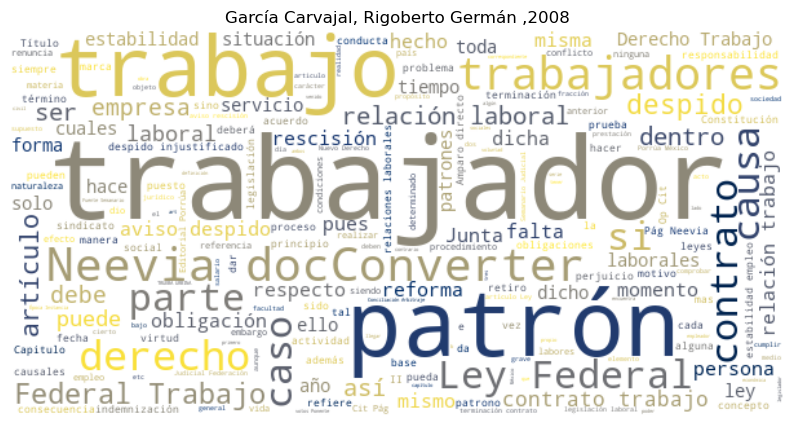

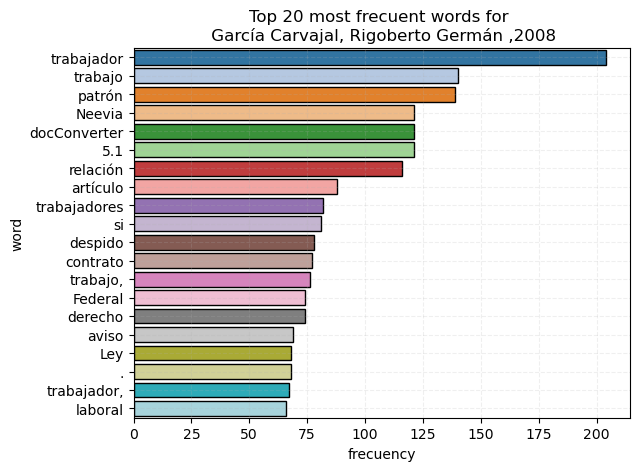

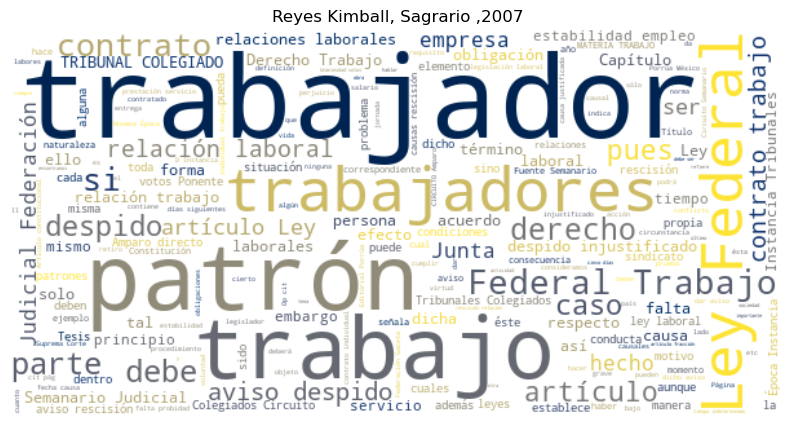

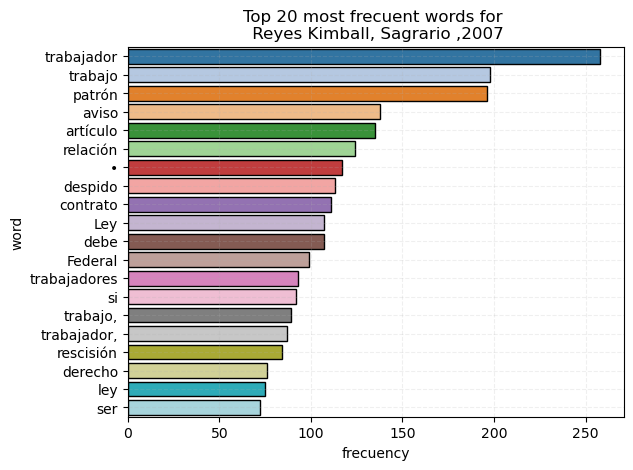

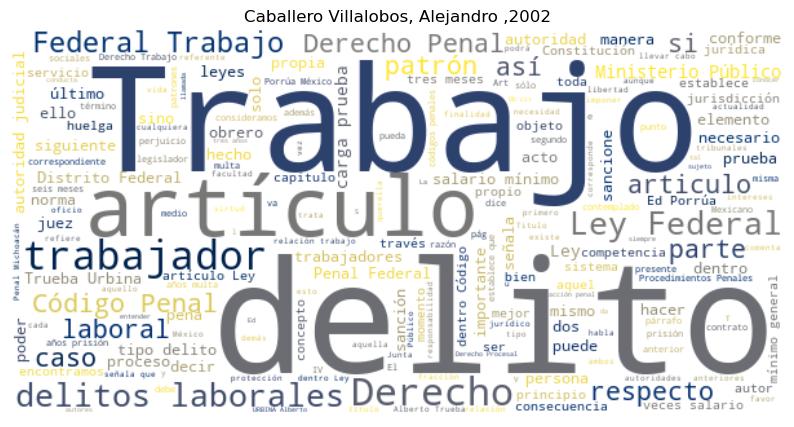

...

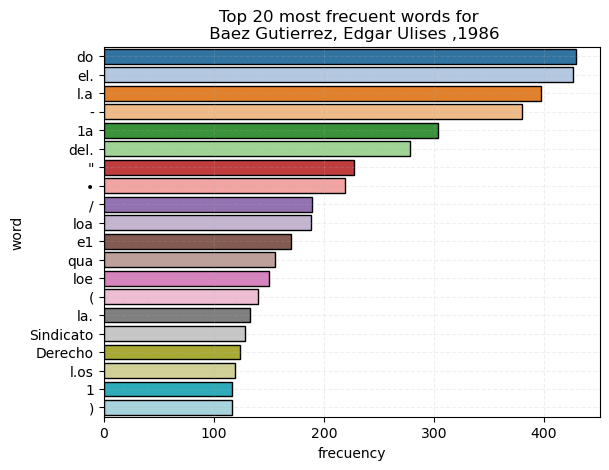

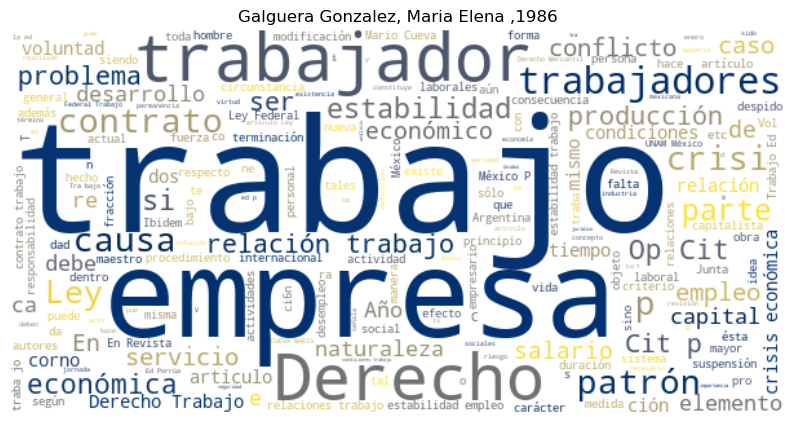

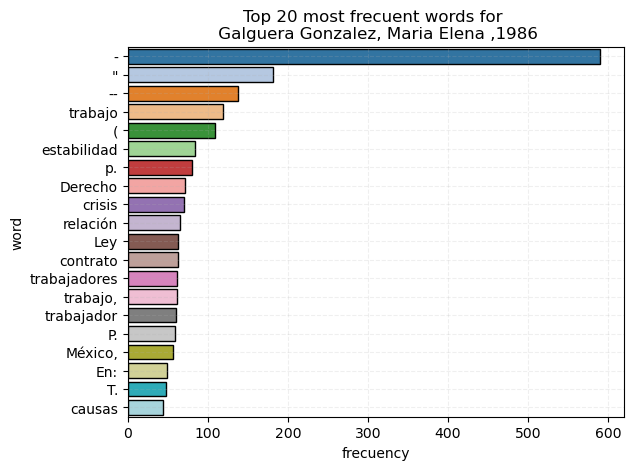

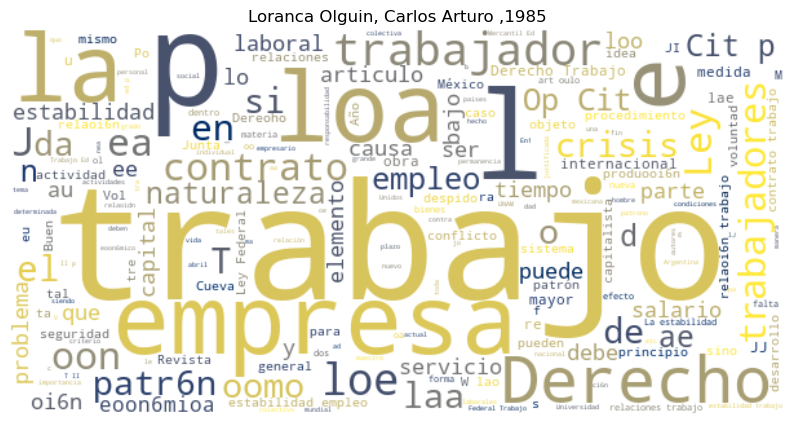

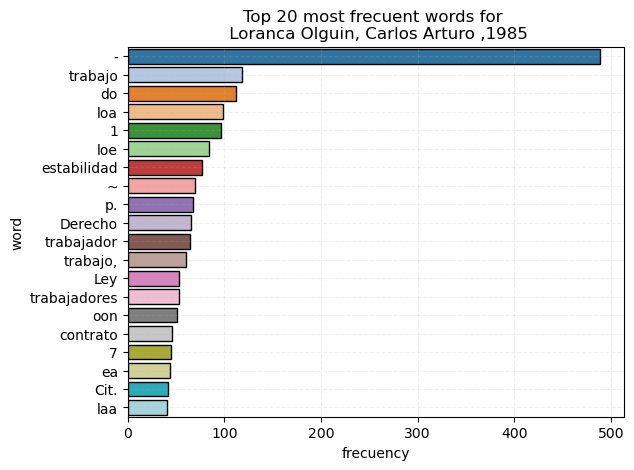

In [56]:
for idx in df[df.plagio == "Yes"].index:

    author = str(df["author"][idx])
    year = str(df["year"][idx])
    title = author + " ," + year
    do_wordcloud(df["text"][idx], title)

In [36]:
print(df["metadata"][446])

print(df["metadata"][462])

{'CreationDate': "D:20180116165628-06'00'", 'ModDate': "D:20221222191320-06'00'", 'Producer': 'iTextSharp 4.1.7 by 1T3XT; modified using iTextSharp™ 5.5.12 ©2000-2017 iText Group NV (AGPL-version)'}
{'CreationDate': "D:20180412163101-05'00'", 'Creator': 'Adobe Acrobat 8.0', 'ModDate': "D:20180427121919-05'00'", 'Producer': 'Neevia PDFresize v3.4 (part of PDFtoolbox - http://neeviaPDF.com)'}


## barplot

In [ ]:
plt.figure(figsize=(5,8))
sns.countplot(data = df, y = "pages", palette="tab20", edgecolor= "black", linewidth=1)

<AxesSubplot:xlabel='count', ylabel='year'>

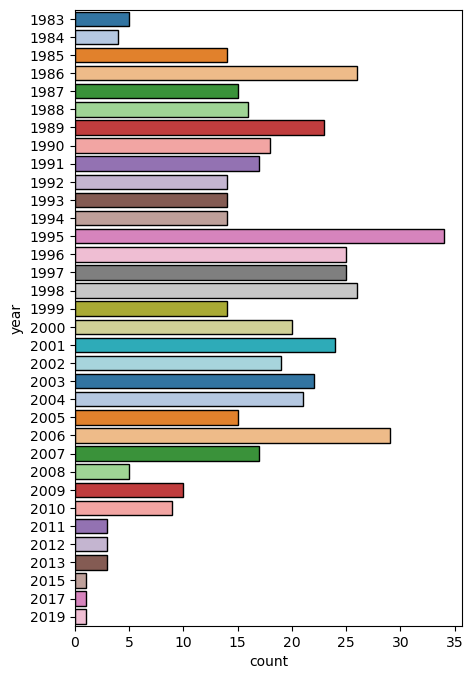

In [111]:
plt.figure(figsize=(5,8))
sns.countplot(data = df, y = "year", palette="tab20", edgecolor= "black", linewidth=1)

Text(0.5, 1.0, 'Tesis dirigidas por Martha Rodríguez, asesora de Yasmín Esquivel')

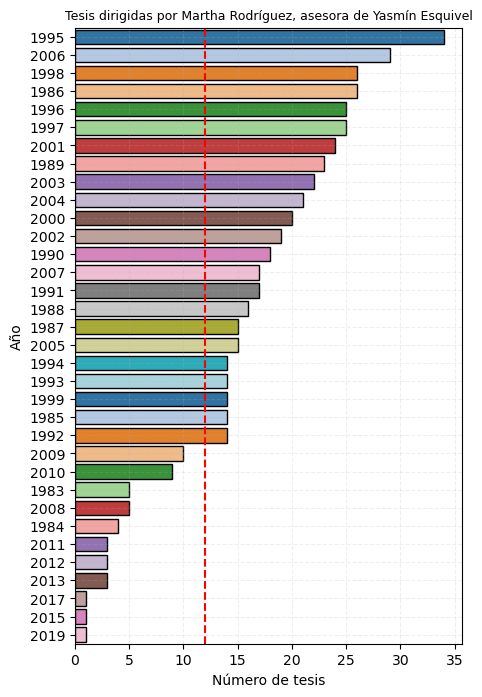

In [19]:
plt.figure(figsize=(5,8))
sns.countplot(
    data = df, y = "year",
     palette="tab20", order = pd.value_counts(df.year).index, edgecolor= "black", linewidth=1)
plt.grid(alpha = 0.2, linestyle = "--")
plt.axvline(x = 12, color = 'red', linestyle = "--")
plt.xlabel("Número de tesis")
plt.ylabel("Año")
plt.title("Tesis dirigidas por Martha Rodríguez, asesora de Yasmín Esquivel",  size=9)

In [36]:
grouped = df.groupby(["year", "institution"]).count()
grouped = grouped.reset_index()
grouped = grouped[["year", "institution", "record"]]
grouped.head()

,year,institution,record
0,1983,Desconocido,1
1,1983,Facultad de derecho,4
2,1984,Desconocido,1
3,1984,Facultad de derecho,3
4,1985,Aragón,1


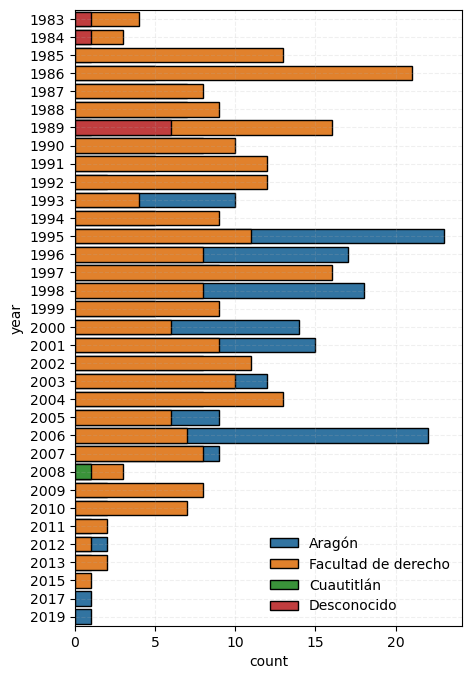

In [113]:
plt.figure(figsize=(5,8))
sns.countplot(
    data = df, y = "year", hue = "institution",
     palette="tab10", dodge=False, edgecolor= "black", linewidth=1)
plt.grid(alpha = 0.2, linestyle = "--")
plt.legend(loc = "lower right", frameon = False)

<AxesSubplot:xlabel='count', ylabel='institution'>

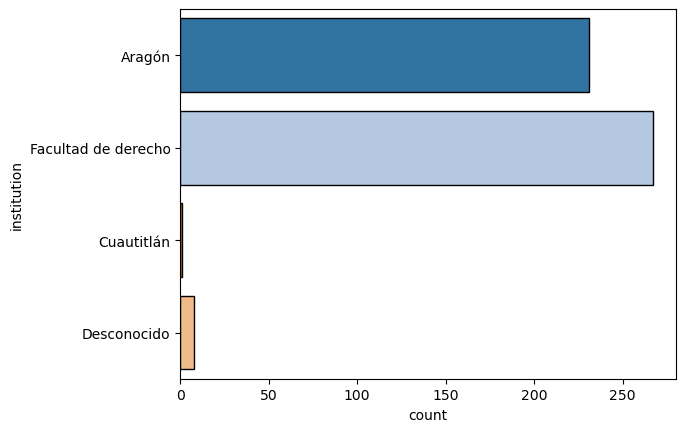

In [57]:
sns.countplot(y = df.institution,palette="tab20", edgecolor= "black", linewidth=1)

## countvector 

In [121]:
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df['text'])

# Calculamos la similitud entre las filas de la matriz de números utilizando el coseno
similitudes = cosine_similarity(X)

# Creamos una lista con los índices de las filas del DataFrame
filas = df.index.tolist()

# Creamos una lista con los valores de similitud
valores = similitudes.tolist()

# Creamos un DataFrame con dos columnas: 'filas' y 'valores'
df_similitud = pd.DataFrame({'filas': filas, 'valores': valores})

In [127]:
df_similitud

,filas,valores
0,0,"[1.000000000000105, 0.9664776228735965, 0.9619..."
1,1,"[0.9664776228735965, 1.0000000000000393, 0.975..."
2,2,"[0.9619517283154008, 0.9753268014690234, 0.999..."
3,3,"[0.9666753207755773, 0.9662452747559214, 0.965..."
4,4,"[0.9649716540710476, 0.9821675926727628, 0.977..."
...,...,...
502,502,"[0.03937087869657801, 0.044426930749478365, 0...."
503,503,"[0.9392983487001884, 0.9551919228140476, 0.951..."
504,504,"[0.9582014035425851, 0.9574293055106016, 0.952..."
505,505,"[0.9557053972694556, 0.9671069858943595, 0.964..."


In [126]:
len(df_similitud.valores[2])

507

In [31]:
vectorizer = CountVectorizer()
X = vectorizer.fit_transform(df['text'])

similitudes = cosine_similarity(X)
df_similitudes = pd.DataFrame(similitudes, columns=df.index, index=df.index)
df_similitudes['year'] = df['year']
df_similitudes

,0,1,year
0,1.000000,0.966478,2019
1,0.966478,1.000000,2017


<AxesSubplot:>

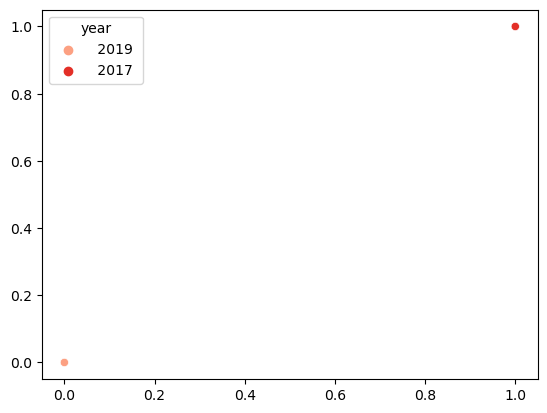

In [36]:
sns.scatterplot(x=df_similitudes.index, y=df_similitudes.index, 
                hue=df_similitudes['year'], palette="Reds", 
                data=df_similitudes)

## pca title 

In [65]:
df["clean_title"] = df["title"].pipe(hero.clean)

df["pca"] = df["clean_title"].pipe(hero.tfidf).pipe(hero.pca)

# Usa la función apply para aplicar una función a cada fila del DataFrame
def extract_values(row):
    # Obtén los valores de la lista en la columna 'values'
    val1, val2 = row['pca']
    # Crea dos nuevas columnas en el DataFrame con los valores extraídos
    row['PCA1'] = val1
    row['PCA2'] = val2
    # Devuelve la fila modificada
    return row

df = df.apply(extract_values, axis=1)
df.head()

,record,degree,author,title,year,pdf,plagio,file,num_pages,text,metadata,institution,unam_id,clean_title,pca,PCA1,PCA2
0,1,lic,"Espinosa Roldán, Hazel,",Las juntas de conciliación y arbitraje y su de...,2019,Texto completo,No,1 - fesa - 0797378_unlocked.pdf,135,UNIVERSIDAD NACIONAL AUTÓNOMA ...,{},Aragón,0797378_unlocked.pdf,las juntas de conciliacion arbitraje su desapa...,"[0.010811396346262164, -0.19488085151607523]",0.010811,-0.194881
1,2,lic,"Alva Rubio, Edson Miguel,",La prima de antigüedad y los trabajadores de c...,2017,Texto completo.,No,2 - fesa - 0759835_unlocked.pdf,129,UNIVERSIDAD NACIONAL AUTÓNOMA DE MÉXICO FA...,"{'Author': 'EDSON MIGUEL ALVA RUBIO', 'Creatio...",Aragón,0759835_unlocked.pdf,la prima de antiguedad los trabajadores de con...,"[-0.3194178799620267, -0.13846498625276527]",-0.319418,-0.138465
2,3,lic,"Mendoza Blanco, Diana María,",Reflexiones sobre el régimen jurídicolaboral d...,2015,Texto completo.,No,3 - fd - 0728576_unlocked.pdf,177,UNIVERSIDAD NACIONAL AUTÓNOMA DE MÉxICO FACU...,"{'Author': 'DIANA MARÍA MENDOZA BLANCO', 'Crea...",Facultad de derecho,0728576_unlocked.pdf,reflexiones sobre el regimen juridicolaboral d...,"[-0.023257421368766167, -0.09379647463758957]",-0.023257,-0.093796
3,4,lic,"Cervantes Guerrero, María de Lourdes,",La cédula profesional vigente o carta de pasan...,2013,Texto completo.,No,4 - fesa - 0704097_unlocked.pdf,132,UNIVERSIDAD NACIONAL AUTÓNOMA ...,{'Author': 'MARÍA DE LOURDES CERVANTES GUERRER...,Aragón,0704097_unlocked.pdf,la cedula profesional vigente carta de pasante...,"[0.082627030533131, -0.15260641712272352]",0.082627,-0.152606
4,5,lic,"Sánchez Fuentes, Salvador,",El intermediario en el derecho laboral mexicano,2013,Texto completo.,No,5 - fd - 0687594_unlocked.pdf,234,UNIVERSIDAD NACIONAL AUTONOMA DE MEXI...,"{'Author': 'Usuario Final', 'CreationDate': 'D...",Facultad de derecho,0687594_unlocked.pdf,el intermediario en el derecho laboral mexicano,"[0.49103537344526105, 0.009219024404041381]",0.491035,0.009219


In [ ]:
df["clean_text"] = df["text"].pipe(hero.clean)

df["pca_text"] = df["clean_text"].pipe(hero.tfidf).pipe(hero.pca)

# Usa la función apply para aplicar una función a cada fila del DataFrame
def extract_values(row):
    # Obtén los valores de la lista en la columna 'values'
    val1, val2 = row['pca']
    # Crea dos nuevas columnas en el DataFrame con los valores extraídos
    row['PCA1_text'] = val1
    row['PCA2_text'] = val2
    # Devuelve la fila modificada
    return row

df = df.apply(extract_values, axis=1)
df.head()

<AxesSubplot:xlabel='PCA1', ylabel='PCA2'>

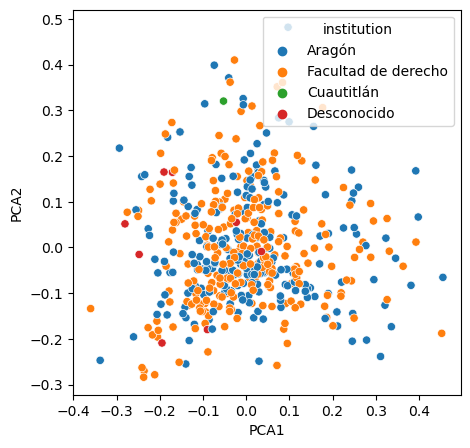

In [64]:
plt.figure(figsize=(5,5))
sns.scatterplot(
    data = df,
    x = "PCA1", y = "PCA2",
    hue = "institution")

In [61]:
fig = px.scatter(
    df,
    x = "PCA1", y = "PCA2",
    color = "institution",
    width=800, height=700,
    hover_name="title",
    hover_data=["author", "year"])

fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
fig.update_layout(template="plotly_white")
#fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
#fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
fig.show()

In [62]:
fig = px.scatter(
    df,
    x = "PCA1", y = "PCA2",
    color = "plagio",
    width=800, height=700,
    hover_name="title",
    hover_data=["author", "year", "record"])

fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
fig.update_layout(template="plotly_white")
#fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
#fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
fig.show()

# my works
https://towardsdatascience.com/plagiarism-detection-using-transformers-b9e7ed5c2a1f

In [11]:
# data manipulation
import pandas as pd
import numpy as np 
import re
import collections


from nltk.corpus import stopwords

import seaborn as sns
import matplotlib.pyplot as plt

# text manipulation
import string  
from collections import defaultdict
import texthero as hero
from wordcloud import WordCloud

In [12]:
# empty list to collect data per file
files = []

# do the next things per each file in the folder
for file in os.listdir("my"):
    
    # open file
    with pdfplumber.open(os.path.join("my", file)) as pdf:

        # get the num pages
        num_pages = len(pdf.pages)

        # concat the text of all pages
        text = "\n".join([page.extract_text() for page in pdf.pages])

        # replace \n by blanck spaces
        # text = text.replace('\n', ' ')

        # get the metadata
        metadata = pdf.metadata

        # add the info to the empty list
        files.append({"file": file, "num_pages": num_pages, "text": text, "metadata": metadata})

# build a df
my = pd.DataFrame(files)
my.head(2)

,file,num_pages,text,metadata
0,gama5.pdf,44,\nTutoral 5 \nPosgrado de Ciencias Bioquímica...,"{'Author': 'LauV', 'Company': '', 'CreationDat..."
1,lic_unlok.pdf,54,\n \nUNIVERSIDAD NACIONAL AUTÓNOMA \n ...,{}


In [13]:
# take the top500 most frecuent words 
def limpiar_texto(texto):
    # Tokenizar el texto
    tokens = texto.split()
    
    # Eliminar signos de puntuación
    tokens = [t.strip(string.punctuation) for t in tokens]
    
    # Eliminar palabras que no aportan información (stopwords)
    stopwords = ["a", "ante", "bajo", "cabe", "con", "contra", "de", "desde", "en", "entre", "hacia", "hasta", "para", "por", "según", "sin", "so", "sobre", "tras"]
    tokens = [t for t in tokens if t not in stopwords]
    
    # Contar cuántas veces aparece cada palabra y ordenarlas por frecuencia
    freq = {}
    for t in tokens:
        if t in freq:
            freq[t] += 1
        else:
            freq[t] = 1
    freq = sorted(freq.items(), key=lambda x: x[1], reverse=True)
    
    # Conservar las 500 palabras más frecuentes y eliminar las demás
    freq = freq[:500]
    tokens = [t for t, f in freq]
    
    # Unir las palabras conservadas en una sola cadena de texto
    clean_text = " ".join(tokens)
    
    return clean_text

# apply to text col
my["clean_text"] = my["text"].apply(limpiar_texto)

In [14]:
# wor cloud: https://github.com/ifrankandrade/data-visualization/blob/main/wordclouds/Wordcloud-Spanish.ipynb
def do_wordcloud(text, title):
    
    # detect common spanish words
    stop_words = set(stopwords.words('spanish'))
    filtered_words = [words for words in text.split() if words.lower() not in stop_words]
    filtered_words = " ".join(filtered_words)
    
    # create the data
    wordcloud = WordCloud(background_color = "white", width = 600, height = 300, contour_width = 3, colormap = "cividis")
    wordcloud = wordcloud.generate(filtered_words)
    
    # plot it
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()
    
    # detect the top 20 fecuent words 
    frecuency = defaultdict(int)
    for word in filtered_words.split():
        frecuency[word] += 1
    
    frecuent_words = sorted(frecuency, key=frecuency.get, reverse=True)[:20]
    df_top20 = pd.DataFrame({"word": frecuent_words, "frecuency": [frecuency[p] for p in frecuent_words]})

    sns.barplot(data = df_top20 , y="word", x="frecuency", edgecolor= "black", linewidth=1, dodge=False, palette="tab20")
    plt.grid(alpha = 0.2, linestyle = "--")
    plt.title(f"Top 20 most frecuent words for \n {title}")

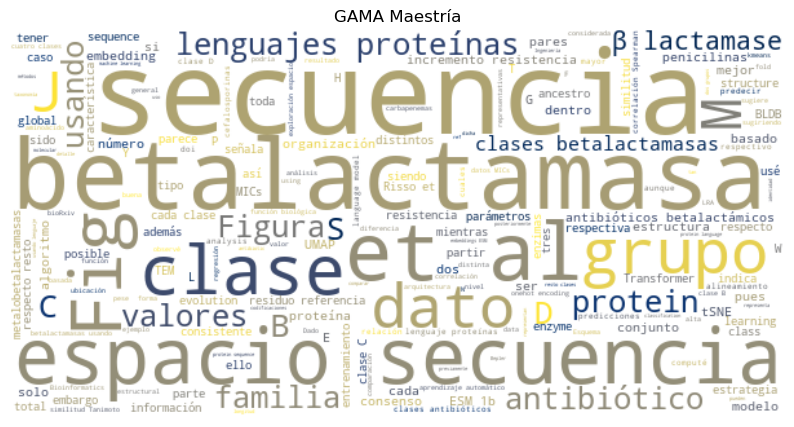

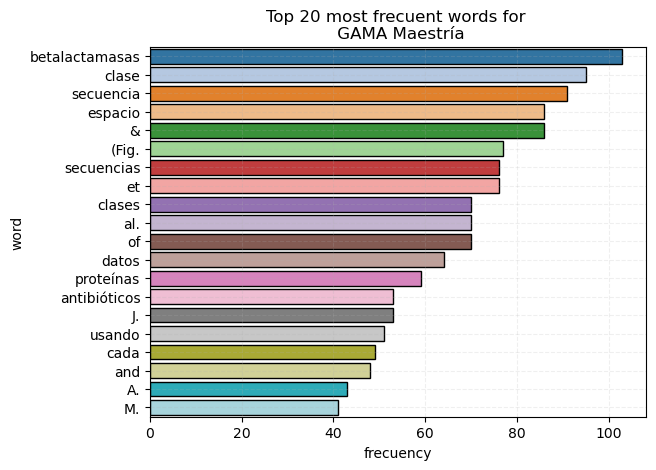

In [21]:
do_wordcloud(my["text"][0], "GAMA Maestría")

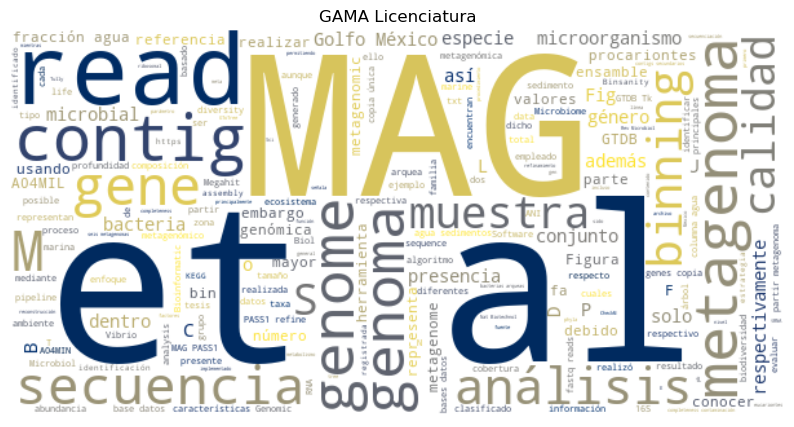

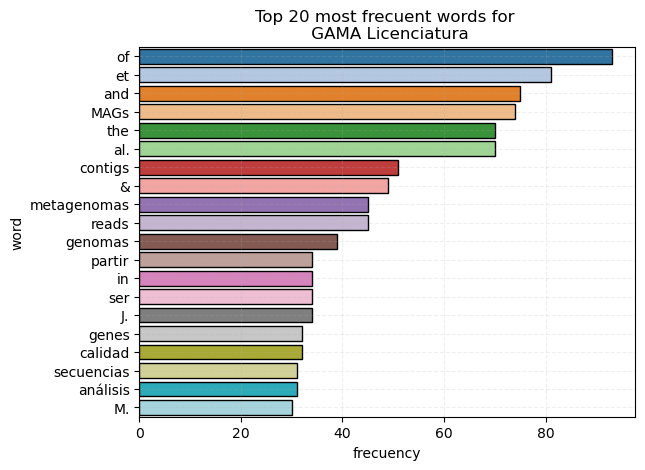

In [20]:
do_wordcloud(my["text"][1], "GAMA Licenciatura")

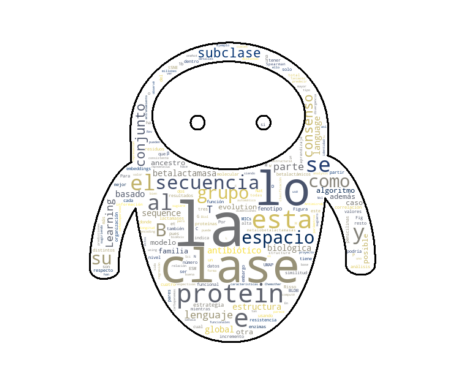

In [26]:
from wordcloud import WordCloud, ImageColorGenerator
from PIL import Image

# cargar la imagen que se utilizará como máscara
mask = np.array(Image.open("/home/gama/desktop/alternative/plagio/my/aaa.png"))

# generar el word cloud
wordcloud = WordCloud(mask=mask,background_color = "white", width = 600, height = 300, 
                      contour_width = 3, colormap = "cividis").generate(my["clean_text"][0])

# mostrar el word cloud
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()